# Imports

In [4]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 76.3 MB/s eta 0:00:00:00:0100:01


In [5]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import gc

from pathlib import Path
import rasterio
import matplotlib.pyplot as plt

# Constants

In [9]:
DATASET_DIR = Path("/kaggle/input/cloud-masking-dataset/content/train")
IMG_DIR =   DATASET_DIR / "data"
MASK_DIR =   DATASET_DIR / "masks"

In [10]:
img_names = [img_name.name for img_name in IMG_DIR.rglob("*")]

In [11]:
len(img_names)

10573

In [12]:
# Normalize bands to [0, 1] for visualization
def normalize(band):
    return (band - band.min()) / (band.max() - band.min())

# EDA

In [13]:
def plot_histogram(x , title , xlabel , ylabel):
    plt.hist(x)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

In [14]:
def show_img_dimension(image_name):
    image_path = IMG_DIR / image_name
    with rasterio.open(image_path) as src:
        print(f"Image Dimensions: {src.width} x {src.height}")

In [15]:
def show_img_with_mask(image_name,figsize = (15,5)):
    """
    Display a satellite image (R,G,B,IR bands) and its cloud mask with optional overlay.
    
    Args:
        image_name (str): name of both the mask and the image from the data
        figsize (tuple): Figure size (width, height).
    """
    
    image_path = IMG_DIR / image_name
    mask_path = MASK_DIR / image_name 
    # Load image and mask
    with rasterio.open(image_path) as src:
        img = src.read()  # Shape: (4, H, W) for R,G,B,IR
    with rasterio.open(mask_path) as src:
        mask = src.read(1)  # Shape: (H, W)

        
    # Prepare RGB and False-Color (IR-G-B) composites
    rgb = np.dstack((normalize(img[0]), normalize(img[1]), normalize(img[2])))  # R,G,B
    false_color = np.dstack((normalize(img[3]), normalize(img[1]), normalize(img[2])))  # IR,G,B

    # Plot
    fig, axes = plt.subplots(1, 4,figsize=figsize)
    
    # RGB Image
    axes[0].imshow(rgb)
    axes[0].set_title('RGB')
    axes[0].axis('off')

    # False-Color (IR-G-B)
    axes[1].imshow(false_color)
    axes[1].set_title('False-Color (IR-G-B)')
    axes[1].axis('off')

    # Mask Image
    axes[2].imshow(mask,cmap = 'gray')
    axes[2].set_title('Mask')
    axes[2].axis('off')

    # RGB with Mask Overlay (Blue = Cloud)
    axes[3].imshow(rgb)
    axes[3].imshow(mask, cmap='Blues', alpha=0.3, vmin=0, vmax=1)
    axes[3].set_title('RGB + Cloud Mask')
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()
    

In [16]:
def calculate_cloud_coverage(mask_path):
    """Compute the percentage of cloud pixels in a mask."""
    with rasterio.open(mask_path) as src:
        mask = src.read(1)
    cloud_pixels = np.sum(mask > 0)  # Count cloud pixels (assuming binary mask)
    total_pixels = mask.size
    return (cloud_pixels / total_pixels) * 100  # Percentage

In [37]:
def get_all_coverage(img_names):
    """Calculate cloud coverage percentages for all imgs.
    
     Returns:
         coverages (list): List of cloud coverage percentages (e.g., [0, 45, 100, ...]).
    """
    coverages = []
    for name in tqdm(img_names):
        if name.endswith('.tif'):
            mask_path = MASK_DIR / name
            coverages.append(calculate_cloud_coverage(mask_path))
    return coverages

In [18]:
def classify_images(coverages):
    """Classify images and return labels (0=cloud-free, 1=partially cloudy, 2=fully clouded)."""
    labels = []
    
    for name, coverage in tqdm(zip(img_names, coverages), total=len(img_names)):
        if coverage == 0:
            labels.append(0)  # Cloud-free
        elif coverage == 100:
            labels.append(2)  # Fully clouded
        else:
            labels.append(1)  # Partially cloudy
    
    return labels

In [44]:
coverages = get_all_coverage(img_names)

100%|██████████| 10573/10573 [00:46<00:00, 225.84it/s]


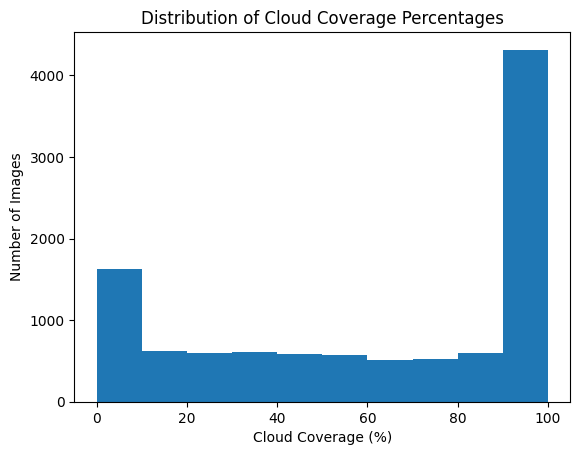

In [20]:
plot_histogram(coverages,'Distribution of Cloud Coverage Percentages' ,'Cloud Coverage (%)' ,  'Number of Images')

In [21]:
labels = classify_images(coverages)

100%|██████████| 10573/10573 [00:00<00:00, 2320341.99it/s]


In [22]:
df = pd.DataFrame({
    'name': img_names,
    'coverage': coverages,
    'label': labels
})

df

,name,coverage,label
0,637566.tif,100.000000,2
1,899444.tif,63.805389,1
2,508060.tif,100.000000,2
3,611187.tif,74.835587,1
4,993021.tif,93.542862,1
...,...,...,...
10568,211726.tif,100.000000,2
10569,804181.tif,97.907639,1
10570,948014.tif,99.990463,1
10571,938403.tif,100.000000,2


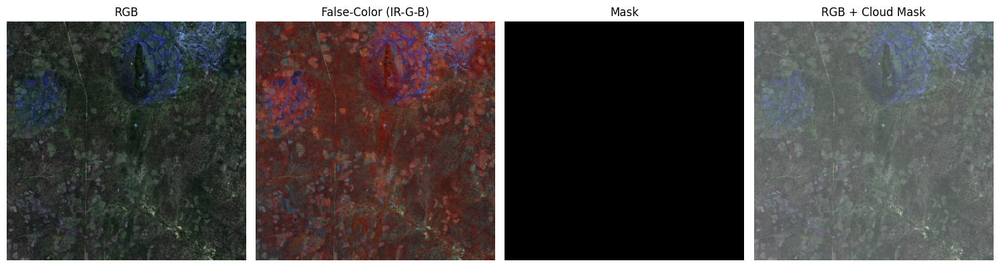

In [23]:
show_img_with_mask(df.loc[df['label'] == 0].iloc[0]['name'])

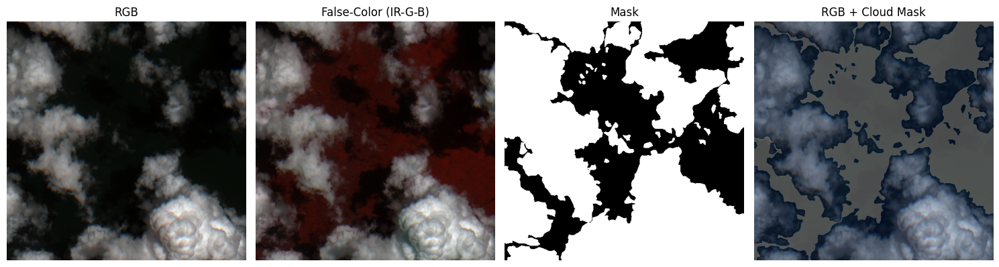

In [24]:
show_img_with_mask(df.loc[df['label'] == 1].iloc[0]['name'])

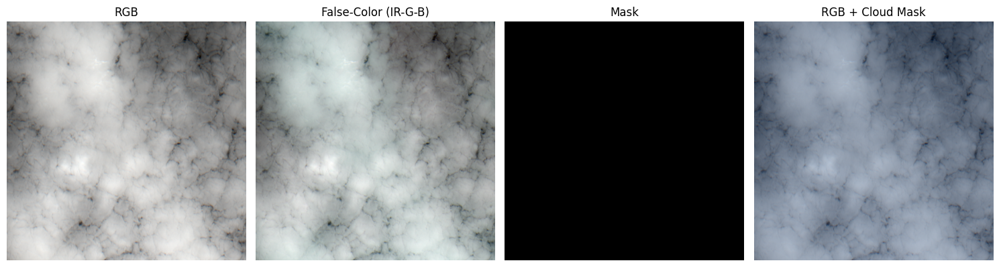

In [25]:
show_img_with_mask(df.loc[df['label'] == 2].iloc[0]['name'])

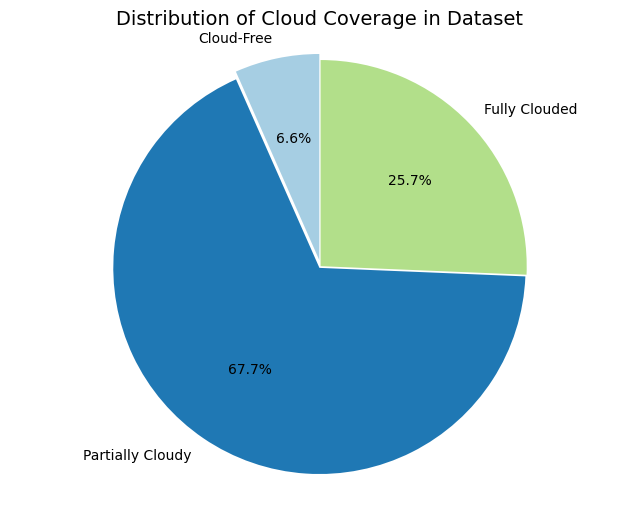

In [26]:
label_counts = df['label'].value_counts().sort_index()

plt.figure(figsize=(8, 6))
plt.pie(
    label_counts,
    labels=['Cloud-Free', 'Partially Cloudy', 'Fully Clouded'],
    autopct='%1.1f%%',  # Show percentages
    startangle=90,
    colors=plt.cm.Paired([0,1,2]),  # Custom colors
    explode=(0.03, 0.01, 0)  # "Explode" a slice
)

plt.title('Distribution of Cloud Coverage in Dataset', fontsize=14)
plt.axis('equal')

plt.show()

In [27]:
show_img_dimension(df.iloc[0]['name'])

Image Dimensions: 512 x 512


## Removing Bad Images

In [28]:
bad_imgs = ["406461.tif", "874668.tif","953740.tif","185569.tif","523808.tif","541314.tif","977340.tif","140163.tif","343962.tif","757386.tif","998435.tif","805477.tif","750810.tif","766738.tif",
"319869.tif","726495.tif","195656.tif","961186.tif","664107.tif","694587.tif","577538.tif","934794.tif","891662.tif","534303.tif","262602.tif","933456.tif","811451.tif","531589.tif","574760.tif",
"872882.tif","539486.tif","688215.tif","715870.tif","385166.tif","602248.tif","796353.tif","439498.tif","585242.tif","726667.tif","962529.tif","704238.tif","333752.tif","136346.tif","140804.tif",
"850435.tif","262934.tif","600318.tif","749468.tif","452058.tif","220031.tif","606957.tif","294760.tif","220936.tif","721826.tif","434132.tif","611945.tif","385959.tif","356639.tif","280222.tif",
"229204.tif","165308.tif","264631.tif","220020.tif","504630.tif","233470.tif","340927.tif","622669.tif","616780.tif","628027.tif","774225.tif","207241.tif","113390.tif","699573.tif","888669.tif",
"946561.tif","873048.tif","718115.tif","505910.tif","999876.tif","196126.tif","986486.tif","469954.tif","390120.tif","831514.tif","355671.tif","276214.tif","951211.tif","311740.tif","223481.tif",
"767578.tif","588533.tif","476018.tif","892313.tif","567574.tif","757629.tif","742818.tif","502460.tif","979988.tif","936223.tif","730421.tif","892170.tif","531641.tif","452457.tif","382154.tif",
"690180.tif","550513.tif","191884.tif","413118.tif","684482.tif","171789.tif","546157.tif","533377.tif","400692.tif","501312.tif","738635.tif","327408.tif","843793.tif","700534.tif","204721.tif",
"517885.tif","947438.tif","950155.tif","299836.tif","131064.tif","120337.tif","673167.tif","673167.tif","710434.tif","289430.tif","769983.tif","233533.tif","325595.tif","43423.tif","541315.tif",
"213000.tif","573039.tif","475565.tif","310647.tif","251631.tif","235047.tif","288128.tif","976303.tif","261771.tif","988811.tif","956360.tif","888939.tif","799565.tif","558737.tif","556379.tif",
"236435.tif","398910.tif","637566.tif",
"104539.tif","508060.tif","134677.tif","512042.tif","435788.tif","876909.tif","230734.tif","216587.tif","926097.tif","718697.tif","230734.tif","352249.tif","282237.tif","852146.tif","970969.tif",
"398916.tif","384076.tif","812597.tif","678469.tif","378727.tif","178465.tif","883171.tif","518309.tif","953266.tif","954814.tif","908812.tif","889743.tif","359249.tif","303765.tif","229660.tif",
"916344.tif","282085.tif","618746.tif","946335.tif","616428.tif","935434.tif","548906.tif","714054.tif","703178.tif","886197.tif","148001.tif","539976.tif","676884.tif","123107.tif","465509.tif",
"912085.tif","675512.tif","426084.tif","110215.tif","486244.tif","604605.tif","979249.tif","755602.tif","153097.tif","920934.tif","742108.tif","570405.tif","326441.tif","741055.tif","241276.tif",
"487896.tif","932250.tif","226516.tif","601903.tif","498591.tif","265759.tif","538446.tif","913594.tif","325583.tif","849937.tif","308496.tif","709908.tif","158936.tif","202827.tif","179710.tif",
"379766.tif","353480.tif","626491.tif","338968.tif","651002.tif","568288.tif","317273.tif","324729.tif","734155.tif","145548.tif","934908.tif","645895.tif","216968.tif","998746.tif","895248.tif",
"659713.tif","409478.tif","221620.tif","226611.tif",
"356622.tif","931420.tif","570711.tif",
"829987.tif","819916.tif",
"835325.tif","824586.tif","912767.tif",
"384815.tif","402380.tif","275526.tif","420349.tif","179013.tif","649855.tif","211090.tif","873774.tif","584045.tif","126135.tif","446265.tif","660324.tif","379133.tif","806215.tif","410401.tif","526117.tif","918213.tif","211425.tif","555052.tif","507524.tif","855777.tif","826501.tif","299800.tif","370413.tif","321659.tif","787657.tif","785611.tif","883159.tif","483349.tif","643899.tif","643899.tif","752878.tif","663356.tif","524252.tif","685466.tif","561865.tif","756401.tif","524707.tif","639764.tif","407419.tif","781463.tif","971230.tif","907236.tif","693616.tif","148205.tif","193670.tif","147623.tif","470774.tif","398911.tif","909000.tif","638289.tif","361728.tif","557592.tif","576849.tif","419491.tif","404704.tif","609462.tif","176604.tif","142859.tif","588316.tif","443492.tif","907812.tif","628313.tif","171951.tif","616342.tif","988217.tif","180657.tif","652266.tif","958620.tif","789023.tif","647639.tif","929912.tif","750810.tif","953452.tif","931016.tif","354085.tif","228479.tif","768480.tif","194952.tif","406327.tif","417003.tif","378517.tif","674553.tif","916356.tif","194782.tif","542828.tif","620306.tif","997287.tif","344303.tif","820539.tif","271241.tif","553633.tif","972064.tif","561023.tif","157217.tif","290724.tif","598940.tif","178629.tif","600811.tif","437742.tif","192742.tif","742917.tif","144894.tif","178957.tif","975804.tif","963508.tif","778748.tif","968581.tif","937302.tif","224582.tif","970196.tif","221628.tif","881206.tif","350786.tif","580728.tif","237606.tif","608257.tif","589710.tif","253235.tif","842866.tif","570622.tif","373943.tif","882033.tif","500112.tif","943726.tif","949884.tif","744693.tif","327900.tif","409222.tif","825835.tif","881828.tif","817956.tif","777737.tif","974190.tif","699929.tif","290802.tif","712553.tif","975290.tif","316642.tif","980152.tif","983687.tif","527066.tif","637234.tif","968726.tif","749887.tif",
"397979.tif",
"280117.tif",
"991597.tif",
"820141.tif",
"788201.tif",
"588557.tif",
"773918.tif",
"165142.tif",
"103468.tif",
"132938.tif",
"333049.tif",
"714867.tif",
"760458.tif",
"246413.tif",
"723155.tif",
"158845.tif",
"276831.tif",
"700705.tif",
"819112.tif",
"415344.tif",
"421384.tif",
"570325.tif",
"268637.tif",
"538997.tif",
"487728.tif",
"319832.tif",
"938016.tif",
"300281.tif",
"261395.tif",
"534649.tif",
"116703.tif",
"310477.tif","563246.tif","954779.tif","182034.tif","716338.tif","946721.tif","247475.tif","484264.tif","767033.tif","269654.tif","539375.tif","278243.tif","848023.tif","535352.tif","566297.tif","139704.tif","310743.tif","499371.tif","737894.tif","549737.tif","401022.tif","370804.tif","547820.tif","905459.tif","189903.tif","662728.tif","221414.tif","366817.tif","677086.tif","538184.tif","240386.tif","193471.tif","199099.tif","774734.tif","966985.tif","353961.tif","137778.tif","255245.tif","636521.tif","272892.tif","972442.tif","468623.tif","598844.tif","497687.tif","656379.tif","820420.tif","233051.tif","964371.tif","168458.tif","395442.tif","786837.tif","891638.tif","594078.tif","790266.tif","920114.tif","829168.tif","834861.tif",
"729057.tif","910326.tif","453487.tif","252203.tif","885342.tif","294776.tif","896907.tif","980303.tif","122056.tif","172187.tif","287588.tif","940952.tif","309505.tif","982023.tif","768636.tif","774079.tif","656837.tif","286340.tif","668532.tif","227257.tif","290305.tif","560295.tif","507777.tif","606676.tif","759104.tif","561101.tif","154644.tif","609232.tif","993085.tif","779378.tif","401663.tif","102565.tif","482199.tif","552760.tif","231165.tif","451317.tif","356736.tif","989136.tif","615500.tif","999138.tif","884229.tif","207175.tif","706005.tif","178463.tif","271790.tif","701987.tif","793300.tif","987624.tif","505674.tif","775960.tif","324479.tif","240814.tif","434827.tif","346174.tif","791838.tif","416950.tif","335122.tif","861594.tif","437978.tif","874524.tif","415759.tif","167136.tif","693022.tif","269430.tif","677321.tif","403524.tif","672967.tif","735242.tif","378428.tif","679958.tif","231414.tif","243057.tif","458605.tif","687713.tif","766269.tif","803904.tif","377370.tif","850981.tif","189026.tif","240600.tif","451577.tif","902575.tif","427679.tif","614688.tif","175623.tif","405605.tif","742191.tif","445658.tif","953025.tif","962050.tif","765620.tif","349185.tif","650311.tif","155164.tif","838083.tif","442838.tif","510154.tif","748665.tif","313068.tif","987110.tif","586706.tif","172222.tif","904214.tif","312146.tif","262816.tif","349087.tif","279451.tif","664365.tif","250038.tif","144235.tif","321686.tif","433451.tif","988102.tif","152046.tif","675111.tif","143195.tif","903986.tif","809621.tif","594312.tif","226882.tif","436030.tif","333210.tif","800305.tif","143195.tif","815819.tif","392683.tif","884475.tif","594312.tif","226882.tif","436030.tif","903986.tif",
"714334.tif","831295.tif","168517.tif","936994.tif","972565.tif","378535.tif","553873.tif","700521.tif","747847.tif","739037.tif","911414.tif","771088.tif","260565.tif","866437.tif","708979.tif","910074.tif","434165.tif","154909.tif","221552.tif","190378.tif","813928.tif","354533.tif","341535.tif","685253.tif","879769.tif","629298.tif","933729.tif","496764.tif","289592.tif","225710.tif","239675.tif","819400.tif","910616.tif","656968.tif","609845.tif","420214.tif","875679.tif","794391.tif","503348.tif","443238.tif","127941.tif","596489.tif","167557.tif","978821.tif","455652.tif","587227.tif","575301.tif","497455.tif","555589.tif","389346.tif","269087.tif","950083.tif","231647.tif","479332.tif","269087.tif","436219.tif","869105.tif","762398.tif","820426.tif","142288.tif","413388.tif","301528.tif","927524.tif","427659.tif","563999.tif","502686.tif","777255.tif","194682.tif","586208.tif","398090.tif","753534.tif","827143.tif","507341.tif","114463.tif","608768.tif","860180.tif","665158.tif","719489.tif","976566.tif","835716.tif","474158.tif","191962.tif","591534.tif","998348.tif","611833.tif","796982.tif","440189.tif","483542.tif","402820.tif","191982.tif","152906.tif","789305.tif","309794.tif","840282.tif","617695.tif","224357.tif","863214.tif","803953.tif","289222.tif","278026.tif","789365.tif","302338.tif","182790.tif","676289.tif","938817.tif","782141.tif","575279.tif","419644.tif","755698.tif","749840.tif","912270.tif","760351.tif","239850.tif","801364.tif","733553.tif","465124.tif","809794.tif","664315.tif","465124.tif","597732.tif","838857.tif","713762.tif","571804.tif","901677.tif","711218.tif","983855.tif","184148.tif","851606.tif","991737.tif","130216.tif","329021.tif","256782.tif","568127.tif","215830.tif","135527.tif","869735.tif",
"503159.tif","624203.tif","350164.tif","631756.tif","908475.tif","112038.tif","856445.tif","891952.tif","662625.tif","598369.tif","743644.tif","763653.tif","398151.tif","936821.tif","273982.tif","247189.tif","161483.tif","377405.tif","281043.tif","829716.tif","907278.tif","432061.tif","389854.tif","269078.tif","975930.tif","859396.tif","563031.tif","583000.tif","835901.tif","428122.tif","274389.tif","865416.tif","660957.tif","725780.tif","549956.tif","980764.tif","952117.tif","928381.tif","295472.tif","454349.tif","986438.tif","377877.tif","748696.tif","797860.tif","690016.tif","299254.tif","563516.tif","297132.tif","923532.tif","633469.tif","106182.tif","181678.tif","510780.tif","330374.tif","156413.tif","873207.tif","378150.tif","824161.tif","926403.tif","230192.tif","214119.tif","655149.tif","707021.tif","910883.tif","111106.tif","843007.tif","952631.tif","683390.tif","696152.tif","180458.tif","476417.tif","642347.tif","403387.tif","827632.tif","556957.tif","140605.tif","152727.tif","611994.tif","986925.tif"
"993916.tif","950916.tif","956721.tif","783501.tif","586849.tif","611265.tif","390946.tif","197793.tif","196973.tif","155708.tif","608205.tif","476710.tif","949352.tif","218844.tif","447372.tif","352036.tif","788457.tif","105274.tif","532046.tif","153802.tif","775105.tif","281708.tif","189814.tif","489933.tif","999308.tif","422823.tif","192337.tif","818666.tif","101885.tif","202344.tif","486831.tif","211726.tif"]

In [31]:
len(bad_imgs)

864

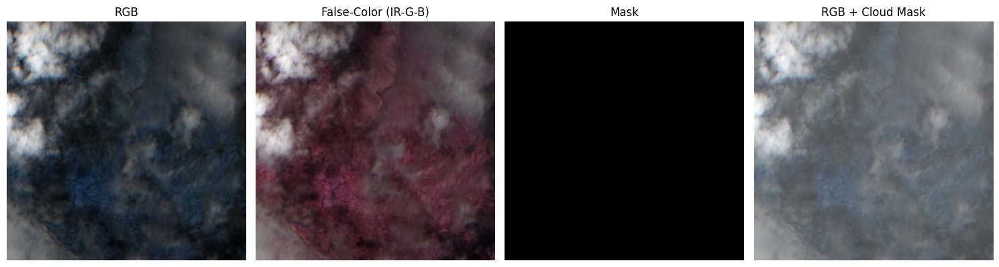

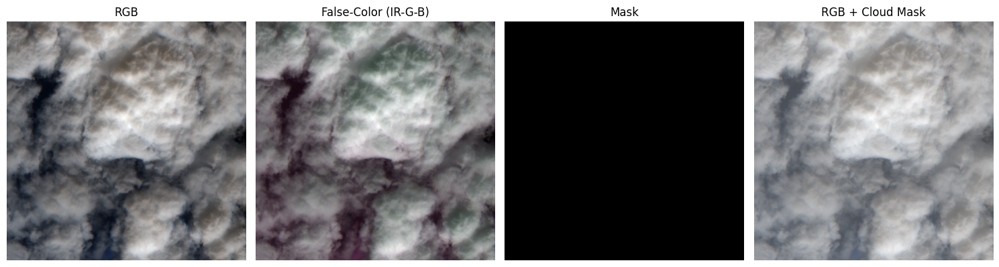

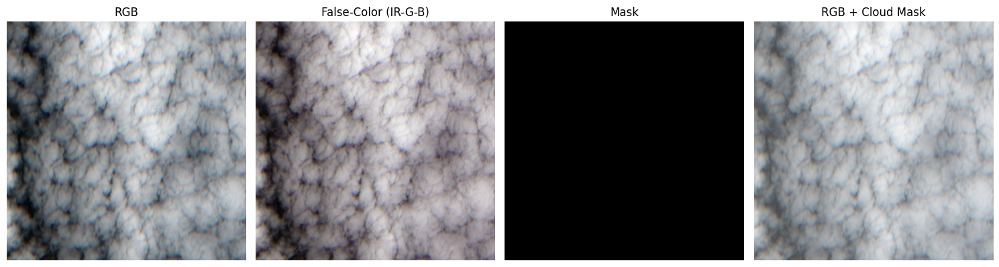

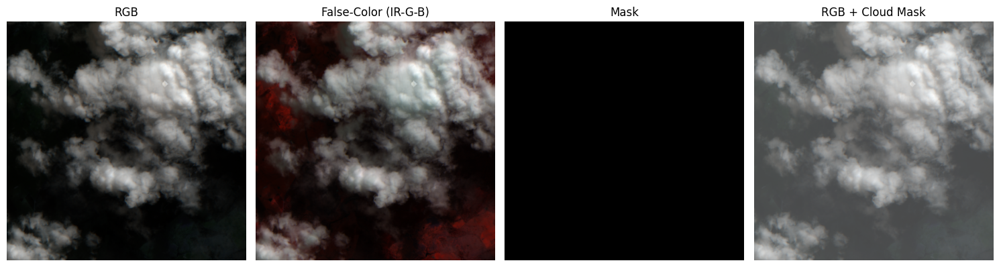

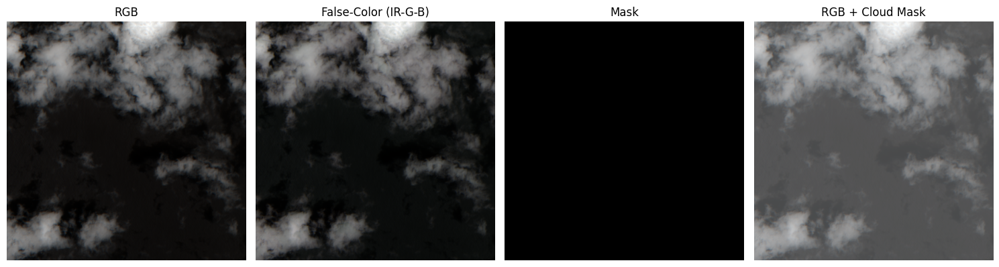

In [34]:
for i in range(5):
    show_img_with_mask(bad_imgs[i])

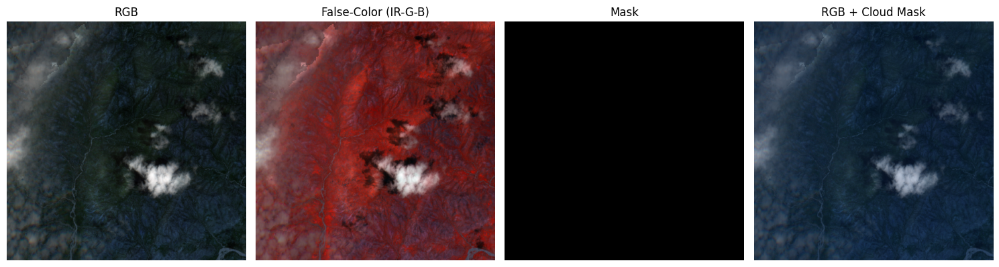

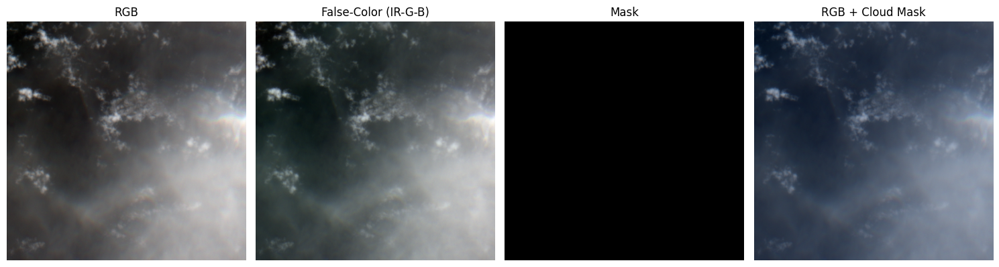

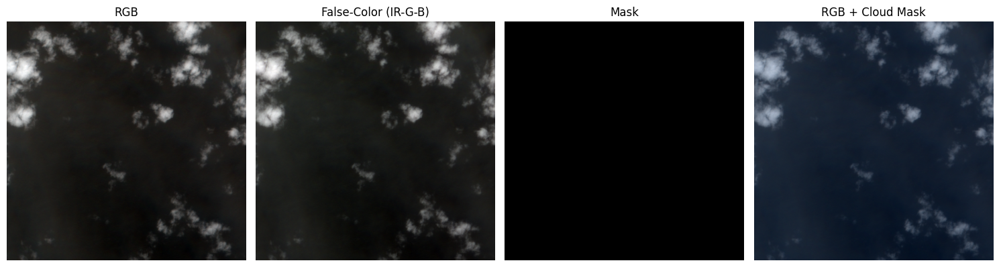

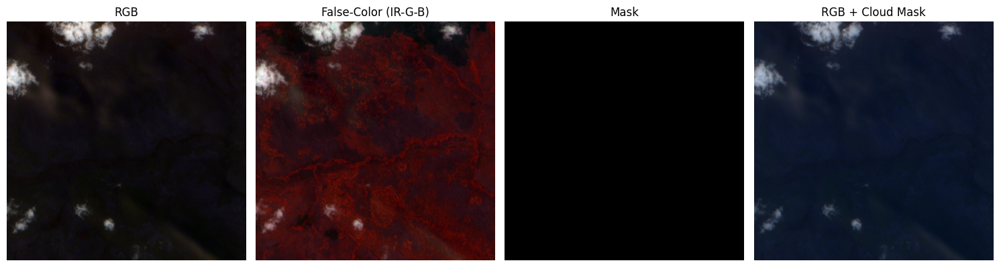

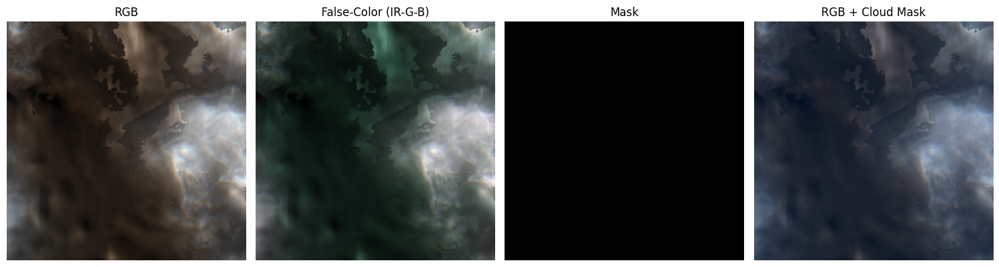

In [35]:
for i in range(5):
    show_img_with_mask(bad_imgs[863-i])

In [36]:
cleaned_imgs = [name for name in img_names if name not in bad_imgs]

In [38]:
coverages = get_all_coverage(cleaned_imgs)

100%|██████████| 9722/9722 [00:43<00:00, 223.59it/s]


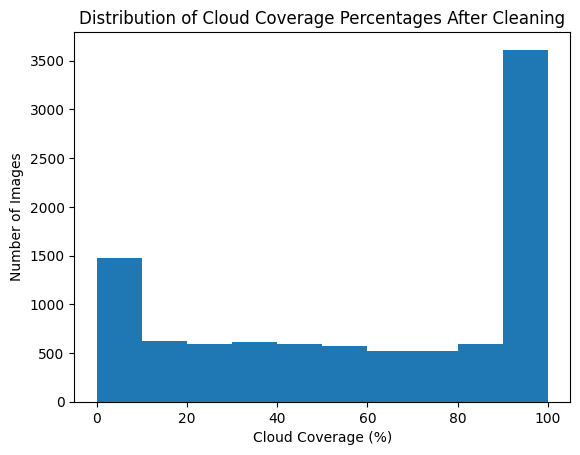

In [39]:
plot_histogram(coverages,'Distribution of Cloud Coverage Percentages After Cleaning' ,'Cloud Coverage (%)' ,  'Number of Images')

In [45]:
labels = classify_images(coverages)

100%|██████████| 10573/10573 [00:00<00:00, 2153886.84it/s]


In [42]:
df = pd.DataFrame({
    'name': cleaned_imgs,
    'coverage': coverages,
    'label': labels
})

df

,name,coverage,label
0,899444.tif,63.805389,1
1,611187.tif,74.835587,1
2,993021.tif,93.542862,1
3,438503.tif,96.077347,1
4,369452.tif,21.590042,1
...,...,...,...
9717,344762.tif,40.133286,1
9718,804181.tif,97.907639,1
9719,948014.tif,99.990463,1
9720,938403.tif,100.000000,2


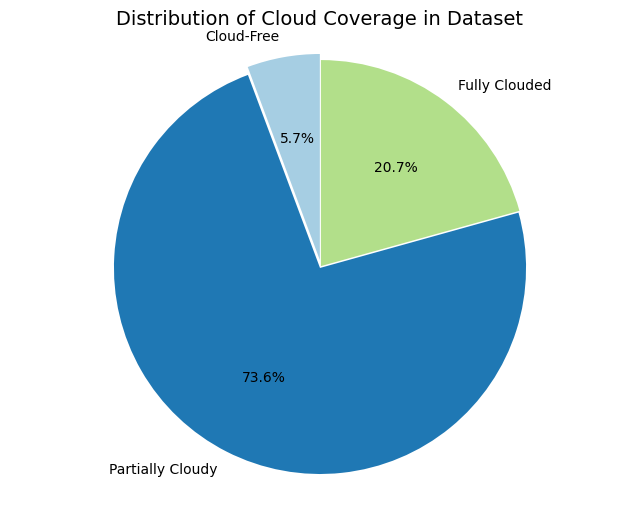

In [43]:
label_counts = df['label'].value_counts().sort_index()

plt.figure(figsize=(8, 6))
plt.pie(
    label_counts,
    labels=['Cloud-Free', 'Partially Cloudy', 'Fully Clouded'],
    autopct='%1.1f%%',  # Show percentages
    startangle=90,
    colors=plt.cm.Paired([0,1,2]),  # Custom colors
    explode=(0.03, 0.01, 0)  # "Explode" a slice
)

plt.title('Distribution of Cloud Coverage in Dataset', fontsize=14)
plt.axis('equal')

plt.show()

In [46]:
df = pd.DataFrame({
    'name': img_names,
    'coverage': coverages,
    'label': labels
})

df

,name,coverage,label
0,637566.tif,100.000000,2
1,899444.tif,63.805389,1
2,508060.tif,100.000000,2
3,611187.tif,74.835587,1
4,993021.tif,93.542862,1
...,...,...,...
10568,211726.tif,100.000000,2
10569,804181.tif,97.907639,1
10570,948014.tif,99.990463,1
10571,938403.tif,100.000000,2


In [47]:
fully_clouded = df.loc[df['label'] == 2]['name']

In [56]:
cleaned_imgs2 = [name for name in img_names if name not in fully_clouded]

In [57]:
coverages = get_all_coverage(cleaned_imgs2)

100%|██████████| 10573/10573 [00:53<00:00, 197.73it/s]


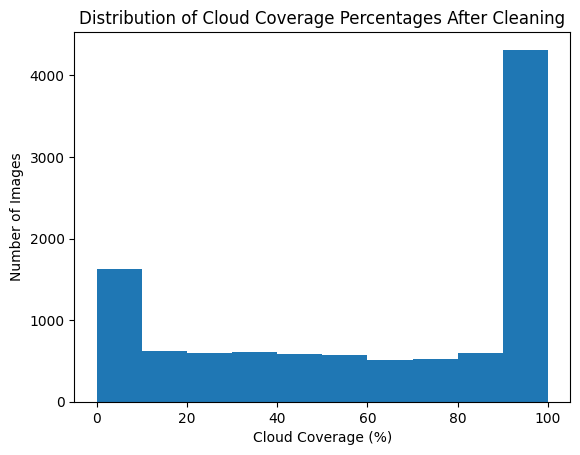

In [58]:
plot_histogram(coverages,'Distribution of Cloud Coverage Percentages After Cleaning' ,'Cloud Coverage (%)' ,  'Number of Images')

In [59]:
labels = classify_images(coverages)

100%|██████████| 10573/10573 [00:00<00:00, 2212341.04it/s]


In [60]:
df = pd.DataFrame({
    'name': cleaned_imgs2,
    'coverage': coverages,
    'label': labels
})

df

,name,coverage,label
0,637566.tif,100.000000,2
1,899444.tif,63.805389,1
2,508060.tif,100.000000,2
3,611187.tif,74.835587,1
4,993021.tif,93.542862,1
...,...,...,...
10568,211726.tif,100.000000,2
10569,804181.tif,97.907639,1
10570,948014.tif,99.990463,1
10571,938403.tif,100.000000,2


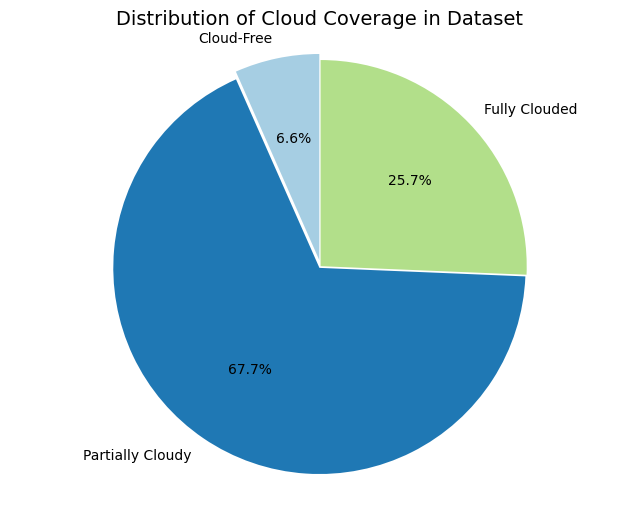

In [61]:
label_counts = df['label'].value_counts().sort_index()

plt.figure(figsize=(8, 6))
plt.pie(
    label_counts,
    labels=['Cloud-Free', 'Partially Cloudy', 'Fully Clouded'],
    autopct='%1.1f%%',  # Show percentages
    startangle=90,
    colors=plt.cm.Paired([0,1,2]),  # Custom colors
    explode=(0.03, 0.01, 0)  # "Explode" a slice
)

plt.title('Distribution of Cloud Coverage in Dataset', fontsize=14)
plt.axis('equal')

plt.show()

## Bands Statistics

In [67]:
import torch
from torch.utils.data import Dataset, DataLoader

In [68]:
class RawDataset(Dataset):
    def __init__(self, img_dir, img_names):
        """Dataset for computing mean/std (no transforms, no normalization)"""
        self.img_dir = Path(img_dir)
        self.img_names = img_names

    def __len__(self):
        return len(self.img_names)

    def __getitem__(self, idx):
        img_name = self.img_names[idx]
        img_path = self.img_dir / img_name

        try:
            with rasterio.open(img_path) as src:
                image = src.read()  # Shape: [4, H, W]
                if image.shape[0] != 4:
                    raise ValueError(f"Image {img_name} has {image.shape[0]} channels, expected 4")
                return image.astype(np.float32)  # Keep as [C, H, W]

        except Exception as e:
            print(f"Error loading {img_name}: {str(e)}")
            return np.zeros((4, 512, 512), dtype=np.float32)

In [ ]:
def compute_dataset_stats(dataset):
    """Compute per-channel mean and std for the dataset.
    Args:
        dataset: Your CustomDataset instance (without normalization)
    Returns:
        means (np.array): [mean_R, mean_G, mean_B, mean_IR]
        stds (np.array): [std_R, std_G, std_B, std_IR]
    """
    # Initialize accumulators
    pixel_sum = np.zeros(4)
    pixel_sq_sum = np.zeros(4)
    num_pixels = 0

    for idx in tqdm(range(len(dataset))):
        img = dataset[idx]  # img shape: [4, H, W]
        img = img.numpy() if isinstance(img, torch.Tensor) else img
        
        # Sum pixels and squared pixels per channel
        pixel_sum += img.sum(axis=(1, 2))
        pixel_sq_sum += (img ** 2).sum(axis=(1, 2))
        num_pixels += img.shape[1] * img.shape[2]

    means = pixel_sum / num_pixels
    stds = np.sqrt((pixel_sq_sum / num_pixels) - (means ** 2))
    
    return means, stds

raw_dataset = RawDataset(IMG_DIR, img_names)
means, stds = compute_dataset_stats(raw_dataset)
print(f"Means: {means}") 
print(f"Stds: {stds}") 

 98%|█████████▊| 10332/10573 [10:55<00:16, 14.90it/s]